https://pythonrepo.com/repo/jacobgil-pytorch-grad-cam

https://github.com/jacobgil/pytorch-grad-cam

|Method|What it does|
|:--:|:--|
|GradCAM|Weight the 2D activations by the average gradient|
|GradCAM++|Like GradCAM but uses second order gradients|
|XGradCAM|Like GradCAM but scale the gradients by the normalized activations|
|AblationCAM|Zero out activations and measure how the output drops (this repository includes a fast batched implementation)|
|ScoreCAM|Perbutate the image by the scaled activations and measure how the output drops|
|EigenCAM|Takes the first principle component of the 2D Activations (no class discrimination, but seems to give great results)|
|EigenGradCAM|Like EigenCAM but with class discrimination: First principle component of Activations*Grad. Looks like GradCAM, but cleaner|
|LayerCAM|Spatially weight the activations by positive gradients. Works better especially in lower layers|

# Import

In [1]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad, EigenGradCAM, LayerCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
import torchvision
import torch
import torch.nn as nn
import cv2
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
from torchvision.models import resnet50

In [3]:
from fastai.vision.all import *
from torchvision import transforms

In [4]:
def label_func(f):
    if f[0].isupper():
        return 'cat' 
    else: 
        return 'dog' 

# Data

In [5]:
path=Path('original_pet') 
files=get_image_files(path)
dls=ImageDataLoaders.from_name_func(path,files,label_func,item_tfms=Resize(512)) 

In [6]:
path_r=Path('random_pet_one')   #랜덤박스넣은사진
files_r=get_image_files(path_r)
dls_r=ImageDataLoaders.from_name_func(path_r,files_r,label_func,item_tfms=Resize(512)) 

# CAM

In [7]:
lrnr=cnn_learner(dls,resnet34,metrics=error_rate)
lrnr.fine_tune(1)

/home/csy/anaconda3/envs/temp_csy/lib/python3.8/site-packages/fastai/vision/learner.py:288: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
/home/csy/anaconda3/envs/temp_csy/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/csy/anaconda3/envs/temp_csy/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time
0,0.167873,0.014196,0.004736,00:33


epoch,train_loss,valid_loss,error_rate,time
0,0.030496,0.002126,0.000677,00:43


In [8]:
net1=lrnr.model[0]
net2=lrnr.model[1]

In [9]:
net2 = torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), 
    torch.nn.Flatten(),
    torch.nn.Linear(512,out_features=2,bias=False))

In [10]:
net=torch.nn.Sequential(net1,net2)

In [11]:
lrnr2=Learner(dls,net,metrics=accuracy) 

In [12]:
lrnr2.fine_tune(5) 

epoch,train_loss,valid_loss,accuracy,time
0,0.249654,0.746290,0.866712,00:42


epoch,train_loss,valid_loss,accuracy,time
0,0.116543,0.134506,0.941137,00:42
1,0.125840,0.115871,0.956698,00:42
2,0.076014,0.128318,0.958051,00:42
3,0.032163,0.059499,0.980379,00:42
4,0.010889,0.042827,0.984438,00:42


In [13]:
lrnr_r=cnn_learner(dls_r,resnet34,metrics=error_rate)
lrnr_r.fine_tune(1)

epoch,train_loss,valid_loss,error_rate,time
0,0.126040,0.003591,0.000677,00:33


epoch,train_loss,valid_loss,error_rate,time
0,0.003319,0.000157,0.000000,00:43


In [14]:
net1_r=lrnr_r.model[0]
net2_r=lrnr_r.model[1]

In [15]:
net2_r = torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), 
    torch.nn.Flatten(),
    torch.nn.Linear(512,out_features=2,bias=False))

In [16]:
net_r=torch.nn.Sequential(net1_r,net2_r)

In [17]:
lrnr2_r=Learner(dls_r,net_r,metrics=accuracy) 

In [18]:
lrnr2_r.fine_tune(5) 

epoch,train_loss,valid_loss,accuracy,time
0,0.014387,0.111444,0.981732,00:42


epoch,train_loss,valid_loss,accuracy,time
0,0.000239,0.000031,1.000000,00:43
1,0.000052,0.000008,1.000000,00:43
2,0.000015,0.000005,1.000000,00:43
3,0.000006,0.000003,1.000000,00:43
4,0.000004,0.000003,1.000000,00:43


In [19]:
x_cat, = first(dls.test_dl([PILImage.create(get_image_files(path)[2])]))
x_cat = x_cat.to('cpu')

In [20]:
x_cat_r, = first(dls_r.test_dl([PILImage.create(get_image_files(path_r)[2])]))
x_cat_r = x_cat_r.to('cpu')

In [21]:
x_dog, = first(dls.test_dl([PILImage.create(get_image_files(path)[12])]))
x_dog = x_dog.to('cpu')

In [22]:
x_dog_r, = first(dls_r.test_dl([PILImage.create(get_image_files(path_r)[12])]))
x_dog_r = x_dog_r.to('cpu')

# GradCAM

## Cat_GradCAM

### Cat_GradCAM_Original

In [23]:
gradcam_original = GradCAM(model=lrnr2.model.to('cpu'), target_layers=lrnr2.model[0][-1])

In [24]:
cam_cat_gradcam_original = gradcam_original(input_tensor=x_cat,targets=None)

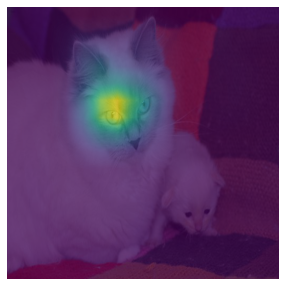

In [25]:
dls.train.decode((x_cat,))[0].squeeze().show()
plt.imshow(cam_cat_gradcam_original.squeeze(), alpha=0.7)

### Cat_GradCAM_Randombox

In [26]:
gradcam_randombox = GradCAM(model=lrnr2_r.model.to('cpu'), target_layers=lrnr2_r.model[0][-1])

In [27]:
cam_cat_gradcam_randombox = gradcam_randombox(input_tensor=x_cat_r,targets=None)

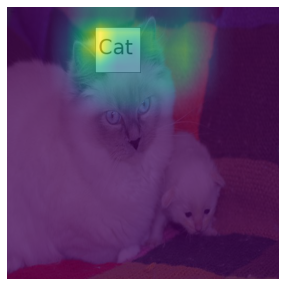

In [28]:
dls.train.decode((x_cat_r,))[0].squeeze().show()
plt.imshow(cam_cat_gradcam_randombox.squeeze(), alpha=0.7)

## Dog_GradCAM

### Dog_GradCAM_Original

In [29]:
cam_dog_gradcam_original = gradcam_original(input_tensor=x_dog,targets=None)

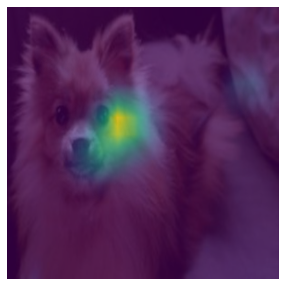

In [30]:
dls.train.decode((x_dog,))[0].squeeze().show()
plt.imshow(cam_dog_gradcam_original.squeeze(), alpha=0.7)

### Dog_GradCAM_Randombox

In [31]:
cam_dog_gradcam_randombox = gradcam_randombox(input_tensor=x_dog_r,targets=None)

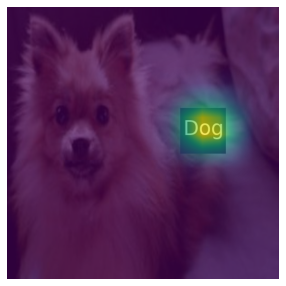

In [32]:
dls.train.decode((x_dog_r,))[0].squeeze().show()
plt.imshow(cam_dog_gradcam_randombox.squeeze(), alpha=0.7)

# HiResCAM

## Cat_HiResCAM

### Cat_HiResCAM_Original

In [33]:
hirescam_original = HiResCAM(model=lrnr2.model.to('cpu'), target_layers=lrnr2.model[0][-1])

In [34]:
cam_cat_hirescam_original = hirescam_original(input_tensor=x_cat,targets=None)

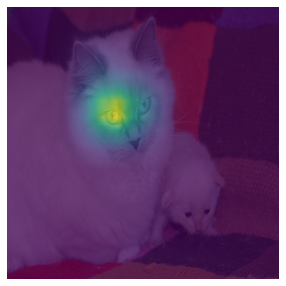

In [35]:
dls.train.decode((x_cat,))[0].squeeze().show()
plt.imshow(cam_cat_hirescam_original.squeeze(), alpha=0.7)

### Cat_HiResCAM_Randombox

In [36]:
hirescam_randombox = HiResCAM(model=lrnr2_r.model.to('cpu'), target_layers=lrnr2_r.model[0][-1])

In [37]:
cam_cat_hirescam_randombox = hirescam_randombox(input_tensor=x_cat_r,targets=None)

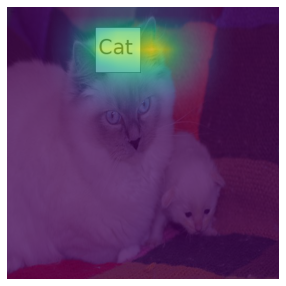

In [38]:
dls.train.decode((x_cat_r,))[0].squeeze().show()
plt.imshow(cam_cat_hirescam_randombox.squeeze(), alpha=0.7)

## Dog_HiResCAM

### Dog_HiResCAM_Original

In [39]:
cam_dog_hirescam_original = hirescam_original(input_tensor=x_dog,targets=None)

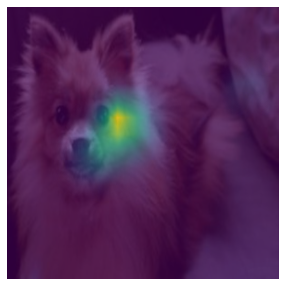

In [40]:
dls.train.decode((x_dog,))[0].squeeze().show()
plt.imshow(cam_dog_hirescam_original.squeeze(), alpha=0.7)

### Dog_HiResCAM_Random

In [41]:
cam_dog_hirescam_randombox = hirescam_randombox(input_tensor=x_dog_r,targets=None)

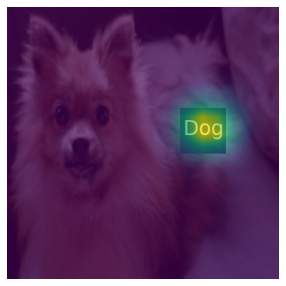

In [42]:
dls.train.decode((x_dog_r,))[0].squeeze().show()
plt.imshow(cam_dog_hirescam_randombox.squeeze(), alpha=0.7)

# ScoreCAM

## Cat_ScoreCAM

### Cat_ScoreCAM_Original

In [43]:
scorecam_original = ScoreCAM(model=lrnr2.model.to('cpu'), target_layers=lrnr2.model[0][-1])

In [44]:
cam_cat_scorecam_original = scorecam_original(input_tensor=x_cat,targets=None)

100%|██████████| 32/32 [00:24<00:00,  1.29it/s]


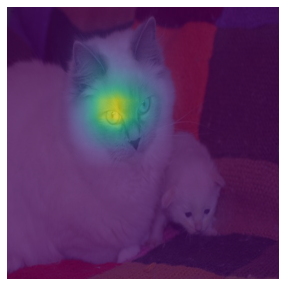

In [45]:
dls.train.decode((x_cat,))[0].squeeze().show()
plt.imshow(cam_cat_scorecam_original.squeeze(), alpha=0.7)

### Cat_ScoreCAM_Randombox

In [46]:
scorecam_randombox = ScoreCAM(model=lrnr2_r.model.to('cpu'), target_layers=lrnr2_r.model[0][-1])

In [47]:
cam_cat_scorecam_randombox = scorecam_randombox(input_tensor=x_cat_r,targets=None)

100%|██████████| 32/32 [00:24<00:00,  1.30it/s]


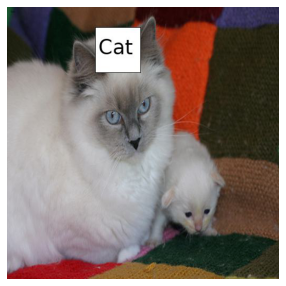

In [48]:
dls.train.decode((x_cat_r,))[0].squeeze().show()
plt.imshow(cam_cat_scorecam_randombox.squeeze(), alpha=0.7)

## Dog_ScoreCAM

### Dog_ScoreCAM_Original

In [49]:
cam_dog_scorecam_original = scorecam_original(input_tensor=x_dog,targets=None)

100%|██████████| 32/32 [00:24<00:00,  1.29it/s]


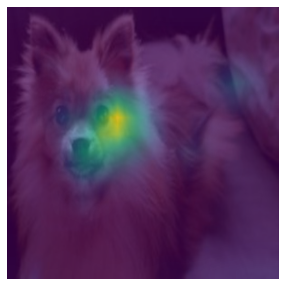

In [50]:
dls.train.decode((x_dog,))[0].squeeze().show()
plt.imshow(cam_dog_scorecam_original.squeeze(), alpha=0.7)

### Dog_ScoreCAM_Randombox

In [51]:
cam_dog_scorecam_randombox = scorecam_randombox(input_tensor=x_dog_r,targets=None)

100%|██████████| 32/32 [00:24<00:00,  1.30it/s]


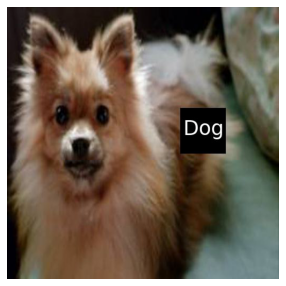

In [52]:
dls.train.decode((x_dog_r,))[0].squeeze().show()
plt.imshow(cam_dog_scorecam_randombox.squeeze(), alpha=0.7)

# GradCAMPlusPlus

## Cat_GradCAMPlusPlus

### Cat_GradCAMPlusPlus_Original

In [53]:
gradcamplusplus_original = GradCAMPlusPlus(model=lrnr2.model.to('cpu'), target_layers=lrnr2.model[0][-1])

In [54]:
cam_cat_gradcamplusplus_original = gradcamplusplus_original(input_tensor=x_cat,targets=None)

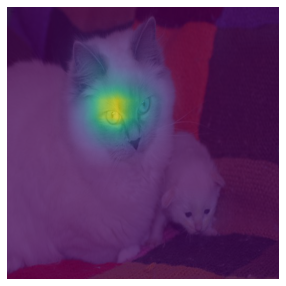

In [55]:
dls.train.decode((x_cat,))[0].squeeze().show()
plt.imshow(cam_cat_gradcamplusplus_original.squeeze(), alpha=0.7)

### Cat_GradCAMPlusPlus_Randombox

In [56]:
gradcamplusplus_randombox = GradCAMPlusPlus(model=lrnr2_r.model.to('cpu'), target_layers=lrnr2_r.model[0][-1])

In [57]:
cam_cat_gradcamplusplus_randombox = gradcamplusplus_randombox(input_tensor=x_cat_r,targets=None)

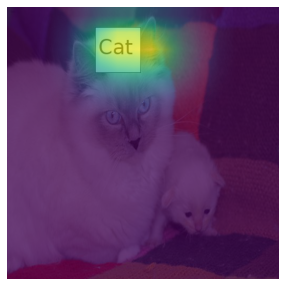

In [58]:
dls.train.decode((x_cat_r,))[0].squeeze().show()
plt.imshow(cam_cat_gradcamplusplus_randombox.squeeze(), alpha=0.7)

## Dog_GradCAMPlusPlus

### Dog_GradCAMPlusPlus_Original

In [59]:
cam_dog_gradcamplusplus_original = gradcamplusplus_original(input_tensor=x_dog,targets=None)

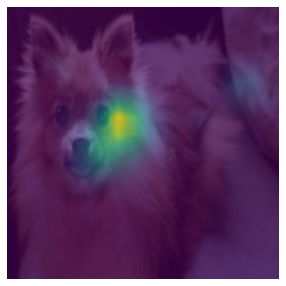

In [60]:
dls.train.decode((x_dog,))[0].squeeze().show()
plt.imshow(cam_dog_gradcamplusplus_original.squeeze(), alpha=0.7)

### Dog_GradCAMPlusPlus_Randombox

In [61]:
cam_dog_gradcamplusplus_randombox = gradcamplusplus_randombox(input_tensor=x_dog_r,targets=None)

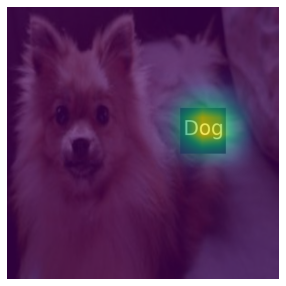

In [62]:
dls.train.decode((x_dog_r,))[0].squeeze().show()
plt.imshow(cam_dog_gradcamplusplus_randombox.squeeze(), alpha=0.7)

# AblationCAM

## Cat_AblationCAM

### Cat_AblationCAM_Original

In [63]:
ablationcam_original = AblationCAM(model=lrnr2.model.to('cpu'), target_layers=lrnr2.model[0][-1])

In [64]:
cam_cat_ablationcam_original = ablationcam_original(input_tensor=x_cat,targets=None)

100%|██████████| 16/16 [00:27<00:00,  1.70s/it]


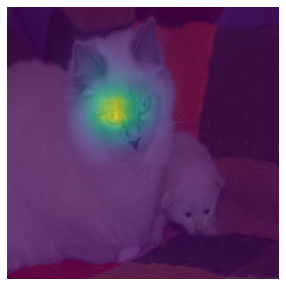

In [65]:
dls.train.decode((x_cat,))[0].squeeze().show()
plt.imshow(cam_cat_ablationcam_original.squeeze(), alpha=0.7)

### Cat_AblationCAM_Randombox

In [66]:
ablationcam_randombox = AblationCAM(model=lrnr2_r.model.to('cpu'), target_layers=lrnr2_r.model[0][-1])

In [67]:
cam_cat_ablationcam_randombox = ablationcam_randombox(input_tensor=x_cat_r,targets=None)

100%|██████████| 16/16 [00:25<00:00,  1.59s/it]


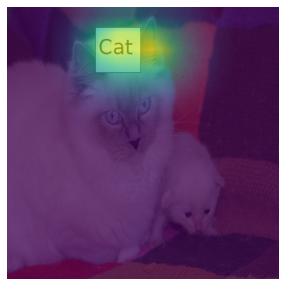

In [68]:
dls.train.decode((x_cat_r,))[0].squeeze().show()
plt.imshow(cam_cat_ablationcam_randombox.squeeze(), alpha=0.7)

## Dog_AblationCAM

### Dog_AblationCAM_Original

In [69]:
cam_dog_ablationcam_original = ablationcam_original(input_tensor=x_dog,targets=None)

100%|██████████| 16/16 [00:25<00:00,  1.61s/it]


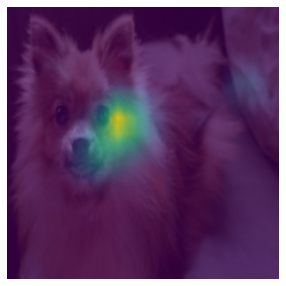

In [70]:
dls.train.decode((x_dog,))[0].squeeze().show()
plt.imshow(cam_dog_ablationcam_original.squeeze(), alpha=0.7)

### Dog_AblationCAM_Randombox

In [71]:
cam_dog_ablationcam_randombox = ablationcam_randombox(input_tensor=x_dog_r,targets=None)

100%|██████████| 16/16 [00:25<00:00,  1.61s/it]


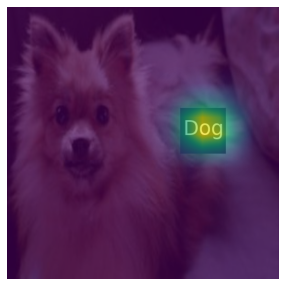

In [72]:
dls.train.decode((x_dog_r,))[0].squeeze().show()
plt.imshow(cam_dog_ablationcam_randombox.squeeze(), alpha=0.7)

# XGradCAM

## Cat_XGradCAM

### Cat_XGradCAM_Original

In [73]:
xgradcam_original = XGradCAM(model=lrnr2.model.to('cpu'), target_layers=lrnr2.model[0][-1])

In [74]:
cam_cat_xgradcam_original = xgradcam_original(input_tensor=x_cat,targets=None)

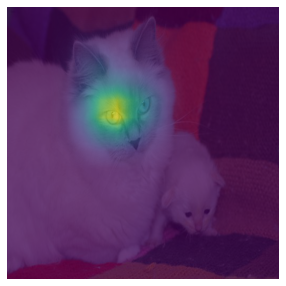

In [75]:
dls.train.decode((x_cat,))[0].squeeze().show()
plt.imshow(cam_cat_xgradcam_original.squeeze(), alpha=0.7)

### Cat_XGradCAM_Randombox

In [76]:
xgradcam_randombox = XGradCAM(model=lrnr2_r.model.to('cpu'), target_layers=lrnr2_r.model[0][-1])

In [77]:
cam_cat_xgradcam_randombox = xgradcam_randombox(input_tensor=x_cat_r,targets=None)

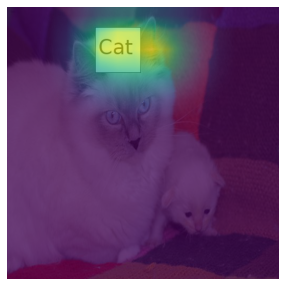

In [78]:
dls.train.decode((x_cat_r,))[0].squeeze().show()
plt.imshow(cam_cat_xgradcam_randombox.squeeze(), alpha=0.7)

## Dog_XGradCAM

### Dog_XGradCAM_Original

In [79]:
cam_dog_xgradcam_original = xgradcam_original(input_tensor=x_dog,targets=None)

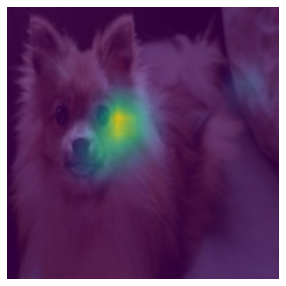

In [80]:
dls.train.decode((x_dog,))[0].squeeze().show()
plt.imshow(cam_dog_xgradcam_original.squeeze(), alpha=0.7)

### Dog_XGradCAM_Randombox

In [81]:
cam_dog_xgradcam_randombox = xgradcam_randombox(input_tensor=x_dog_r,targets=None)

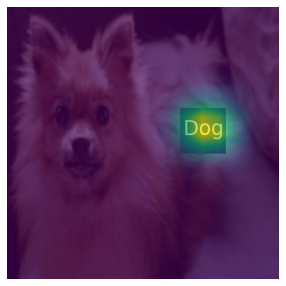

In [82]:
dls.train.decode((x_dog_r,))[0].squeeze().show()
plt.imshow(cam_dog_xgradcam_randombox.squeeze(), alpha=0.7)

# EigenCAM

## Cat_EigenCAM

### Cat_EigenCAM_Original

In [83]:
eigencam_original = EigenCAM(model=lrnr2.model.to('cpu'), target_layers=lrnr2.model[0][-1])

In [84]:
cam_cat_eigencam_original = eigencam_original(input_tensor=x_cat,targets=None)

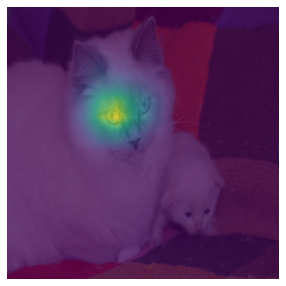

In [85]:
dls.train.decode((x_cat,))[0].squeeze().show()
plt.imshow(cam_cat_eigencam_original.squeeze(), alpha=0.7)

### Cat_EigenCAM_Randombox

In [86]:
eigencam_randombox = EigenCAM(model=lrnr2_r.model.to('cpu'), target_layers=lrnr2_r.model[0][-1])

In [87]:
cam_cat_eigencam_randombox = eigencam_randombox(input_tensor=x_cat_r,targets=None)

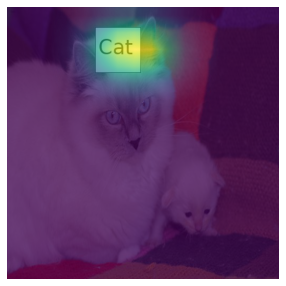

In [88]:
dls.train.decode((x_cat_r,))[0].squeeze().show()
plt.imshow(cam_cat_eigencam_randombox.squeeze(), alpha=0.7)

## Dog_EigenCAM

### Dog_EigenCAM_Original

In [89]:
cam_dog_eigencam_original = eigencam_original(input_tensor=x_dog,targets=None)

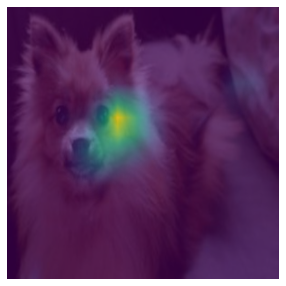

In [90]:
dls.train.decode((x_dog,))[0].squeeze().show()
plt.imshow(cam_dog_eigencam_original.squeeze(), alpha=0.7)

### Dog_EigenCAM_Randombox

In [91]:
cam_dog_eigencam_randombox = eigencam_randombox(input_tensor=x_dog_r,targets=None)

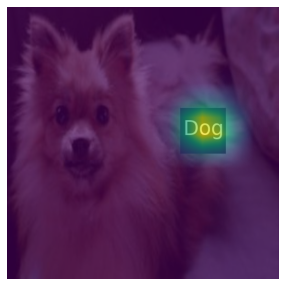

In [92]:
dls.train.decode((x_dog_r,))[0].squeeze().show()
plt.imshow(cam_dog_eigencam_randombox.squeeze(), alpha=0.7)

# FullGrad

## Cat_FullGrad

### Cat_FullGrad_Original

In [93]:
fullgrad_original = FullGrad(model=lrnr2.model.to('cpu'), target_layers=lrnr2.model[0][-1])

In [94]:
cam_cat_fullgrad_original = fullgrad_original(input_tensor=x_cat,targets=None)

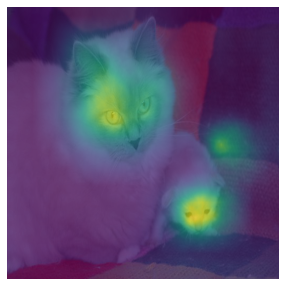

In [95]:
dls.train.decode((x_cat,))[0].squeeze().show()
plt.imshow(cam_cat_fullgrad_original.squeeze(), alpha=0.7)

### Cat_FullGrad_Randombox

In [96]:
fullgrad_randombox = FullGrad(model=lrnr2_r.model.to('cpu'), target_layers=lrnr2_r.model[0][-1])

In [97]:
cam_cat_fullgrad_randombox = fullgrad_randombox(input_tensor=x_cat_r,targets=None)

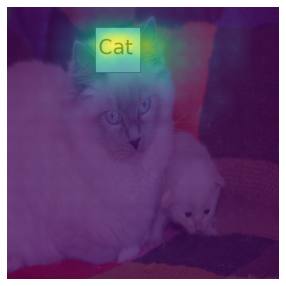

In [98]:
dls.train.decode((x_cat_r,))[0].squeeze().show()
plt.imshow(cam_cat_fullgrad_randombox.squeeze(), alpha=0.7)

## Dog_FullGrad

### Dog_FullGrad_Original

In [99]:
cam_dog_fullgrad_original = fullgrad_original(input_tensor=x_dog,targets=None)

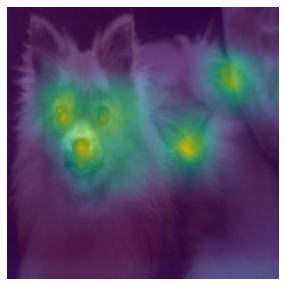

In [100]:
dls.train.decode((x_dog,))[0].squeeze().show()
plt.imshow(cam_dog_fullgrad_original.squeeze(), alpha=0.7)

### Dog_FullGrad_Randombox

In [101]:
cam_dog_fullgrad_randombox = fullgrad_randombox(input_tensor=x_dog_r,targets=None)

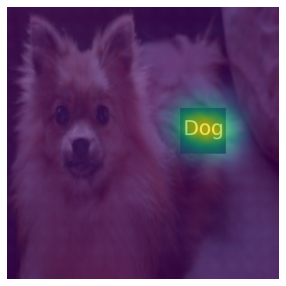

In [102]:
dls.train.decode((x_dog_r,))[0].squeeze().show()
plt.imshow(cam_dog_fullgrad_randombox.squeeze(), alpha=0.7)

# EigenGradCAM

## Cat_EigenGradCAM

### Cat_EigenGradCAM_Original

In [103]:
eigengradcam_original = EigenGradCAM(model=lrnr2.model.to('cpu'), target_layers=lrnr2.model[0][-1])

In [104]:
cam_cat_eigengradcam_original = eigengradcam_original(input_tensor=x_cat,targets=None)

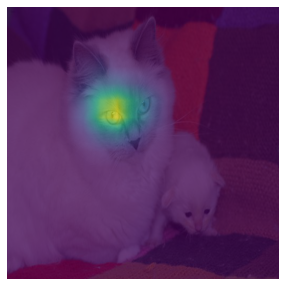

In [105]:
dls.train.decode((x_cat,))[0].squeeze().show()
plt.imshow(cam_cat_eigengradcam_original.squeeze(), alpha=0.7)

### Cat_EigenGradCAM_Randombox

In [106]:
eigengradcam_randombox = EigenGradCAM(model=lrnr2_r.model.to('cpu'), target_layers=lrnr2_r.model[0][-1])

In [107]:
cam_cat_eigengradcam_randombox = eigengradcam_randombox(input_tensor=x_cat_r,targets=None)

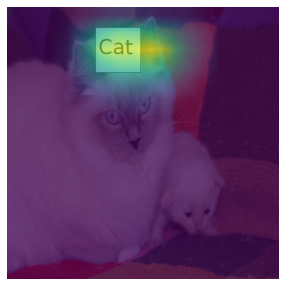

In [108]:
dls.train.decode((x_cat_r,))[0].squeeze().show()
plt.imshow(cam_cat_eigengradcam_randombox.squeeze(), alpha=0.7)

## Dog_EigenGradCAM

### Dog_EigenGradCAM_Original

In [109]:
cam_dog_eigengradcam_original = eigengradcam_original(input_tensor=x_dog,targets=None)

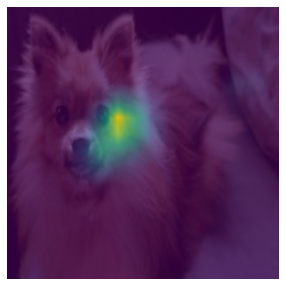

In [110]:
dls.train.decode((x_dog,))[0].squeeze().show()
plt.imshow(cam_dog_eigengradcam_original.squeeze(), alpha=0.7)

### Dog_EigenGradCAM_Randombox

In [111]:
cam_dog_eigengradcam_randombox = eigengradcam_randombox(input_tensor=x_dog_r,targets=None)

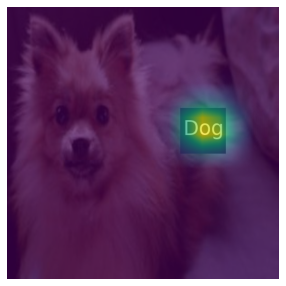

In [112]:
dls.train.decode((x_dog_r,))[0].squeeze().show()
plt.imshow(cam_dog_eigengradcam_randombox.squeeze(), alpha=0.7)

# LayerCAM

## Cat_LayerCAM

### Cat_LayerCAM_Original

In [113]:
layercam_original = LayerCAM(model=lrnr2.model.to('cpu'), target_layers=lrnr2.model[0][-1])

In [114]:
cam_cat_layercam_original = layercam_original(input_tensor=x_cat,targets=None)

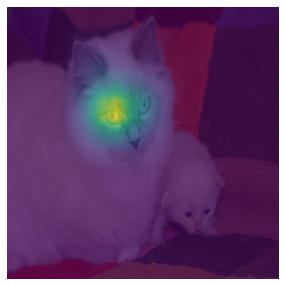

In [115]:
dls.train.decode((x_cat,))[0].squeeze().show()
plt.imshow(cam_cat_layercam_original.squeeze(), alpha=0.7)

### Cat_LayerCAM_Randombox

In [116]:
layercam_randombox = LayerCAM(model=lrnr2_r.model.to('cpu'), target_layers=lrnr2_r.model[0][-1])

In [117]:
cam_cat_layercam_randombox = layercam_randombox(input_tensor=x_cat_r,targets=None)

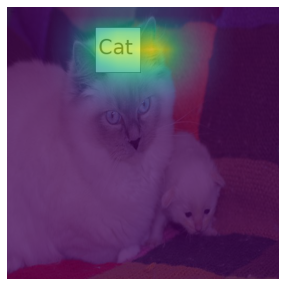

In [118]:
dls.train.decode((x_cat_r,))[0].squeeze().show()
plt.imshow(cam_cat_layercam_randombox.squeeze(), alpha=0.7)

## Dog_LayerCAM

## Dog_LayerCAM_Original

In [119]:
cam_dog_layercam_original = layercam_original(input_tensor=x_dog,targets=None)

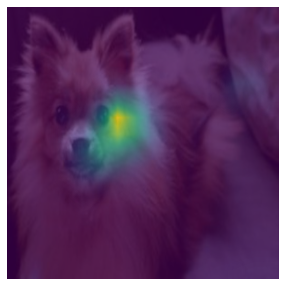

In [120]:
dls.train.decode((x_dog,))[0].squeeze().show()
plt.imshow(cam_dog_layercam_original.squeeze(), alpha=0.7)

## Dog_LayerCAM_Randombox

In [121]:
cam_dog_layercam_randombox = layercam_randombox(input_tensor=x_dog_r,targets=None)

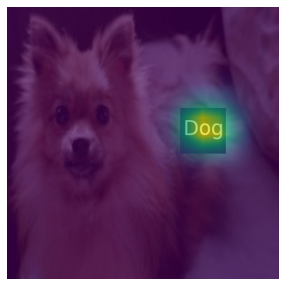

In [122]:
dls.train.decode((x_dog_r,))[0].squeeze().show()
plt.imshow(cam_dog_layercam_randombox.squeeze(), alpha=0.7)

# Figure

In [126]:
import pickle

## Figure_Original

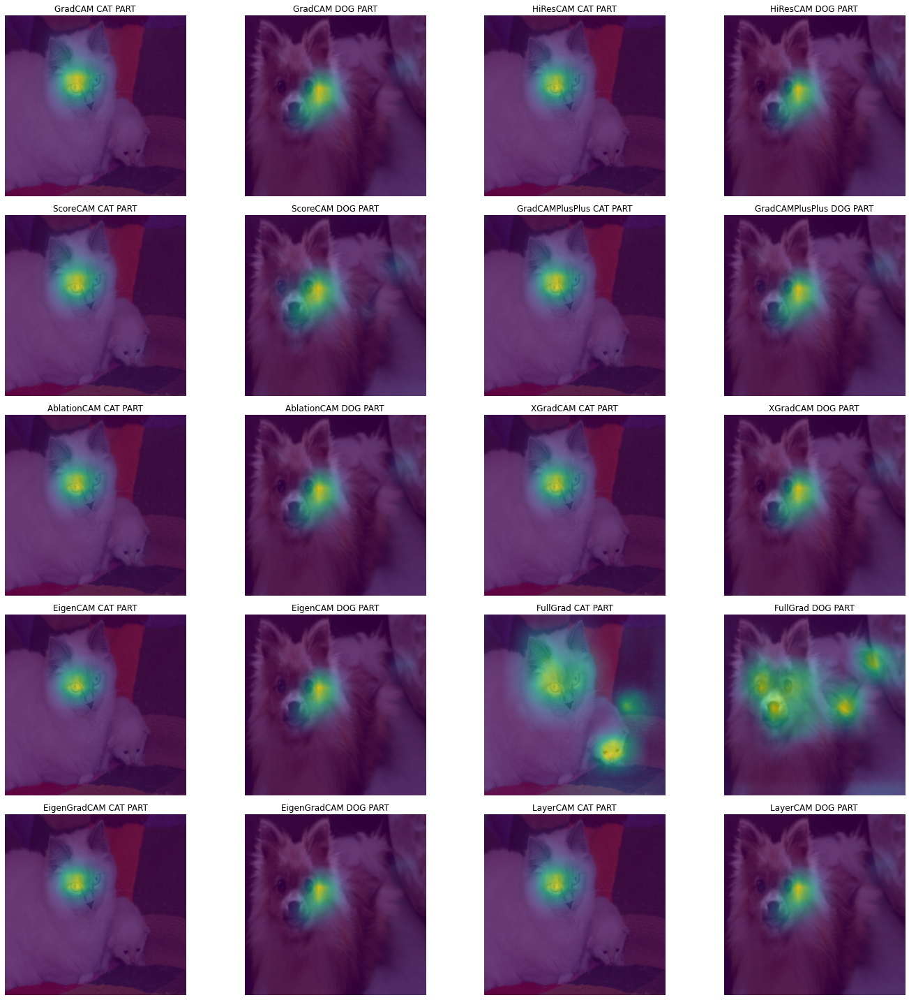

In [127]:
fig, ((ax1,ax2,ax3,ax4),
      (ax5,ax6,ax7,ax8),
      (ax9,ax10,ax11,ax12),
      (ax13,ax14,ax15,ax16),
     (ax17,ax18,ax19,ax20)) = plt.subplots(5,4) 
plt.title('Original')
#
dls.train.decode((x_cat,))[0].squeeze().show(ax=ax1)
ax1.imshow(cam_cat_gradcam_original.squeeze(), alpha=0.7)
ax1.set_title("GradCAM CAT PART")
#
dls.train.decode((x_dog,))[0].squeeze().show(ax=ax2)
ax2.imshow(cam_dog_gradcam_original.squeeze(), alpha=0.7)
ax2.set_title("GradCAM DOG PART")
#
dls.train.decode((x_cat,))[0].squeeze().show(ax=ax3)
ax3.imshow(cam_cat_hirescam_original.squeeze(), alpha=0.7)
ax3.set_title("HiResCAM CAT PART")
#
dls.train.decode((x_dog,))[0].squeeze().show(ax=ax4)
ax4.imshow(cam_dog_hirescam_original.squeeze(), alpha=0.7)
ax4.set_title("HiResCAM DOG PART")
#
dls.train.decode((x_cat,))[0].squeeze().show(ax=ax5)
ax5.imshow(cam_cat_scorecam_original.squeeze(), alpha=0.7)
ax5.set_title("ScoreCAM CAT PART")
#
dls.train.decode((x_dog,))[0].squeeze().show(ax=ax6)
ax6.imshow(cam_dog_scorecam_original.squeeze(), alpha=0.7)
ax6.set_title("ScoreCAM DOG PART")
#
dls.train.decode((x_cat,))[0].squeeze().show(ax=ax7)
ax7.imshow(cam_cat_gradcamplusplus_original.squeeze(), alpha=0.7)
ax7.set_title("GradCAMPlusPlus CAT PART")
#
dls.train.decode((x_dog,))[0].squeeze().show(ax=ax8)
ax8.imshow(cam_dog_gradcamplusplus_original.squeeze(), alpha=0.7)
ax8.set_title("GradCAMPlusPlus DOG PART")
#
dls.train.decode((x_cat,))[0].squeeze().show(ax=ax9)
ax9.imshow(cam_cat_ablationcam_original.squeeze(), alpha=0.7)
ax9.set_title("AblationCAM CAT PART")
#
dls.train.decode((x_dog,))[0].squeeze().show(ax=ax10)
ax10.imshow(cam_dog_ablationcam_original.squeeze(), alpha=0.7)
ax10.set_title("AblationCAM DOG PART")
#
dls.train.decode((x_cat,))[0].squeeze().show(ax=ax11)
ax11.imshow(cam_cat_xgradcam_original.squeeze(), alpha=0.7)
ax11.set_title("XGradCAM CAT PART")
#
dls.train.decode((x_dog,))[0].squeeze().show(ax=ax12)
ax12.imshow(cam_dog_xgradcam_original.squeeze(), alpha=0.7)
ax12.set_title("XGradCAM DOG PART")
#
dls.train.decode((x_cat,))[0].squeeze().show(ax=ax13)
ax13.imshow(cam_cat_eigencam_original.squeeze(), alpha=0.7)
ax13.set_title("EigenCAM CAT PART")
#
dls.train.decode((x_dog,))[0].squeeze().show(ax=ax14)
ax14.imshow(cam_dog_eigencam_original.squeeze(), alpha=0.7)
ax14.set_title("EigenCAM DOG PART")
#
dls.train.decode((x_cat,))[0].squeeze().show(ax=ax15)
ax15.imshow(cam_cat_fullgrad_original.squeeze(), alpha=0.7)
ax15.set_title("FullGrad CAT PART")
#
dls.train.decode((x_dog,))[0].squeeze().show(ax=ax16)
ax16.imshow(cam_dog_fullgrad_original.squeeze(), alpha=0.7)
ax16.set_title("FullGrad DOG PART")
#
dls.train.decode((x_cat,))[0].squeeze().show(ax=ax17)
ax17.imshow(cam_cat_eigengradcam_original.squeeze(), alpha=0.7)
ax17.set_title("EigenGradCAM CAT PART")
#
dls.train.decode((x_dog,))[0].squeeze().show(ax=ax18)
ax18.imshow(cam_dog_eigengradcam_original.squeeze(), alpha=0.7)
ax18.set_title("EigenGradCAM DOG PART")
#
dls.train.decode((x_cat,))[0].squeeze().show(ax=ax19)
ax19.imshow(cam_cat_layercam_original.squeeze(), alpha=0.7)
ax19.set_title("LayerCAM CAT PART")
#
dls.train.decode((x_dog,))[0].squeeze().show(ax=ax20)
ax20.imshow(cam_dog_layercam_original.squeeze(), alpha=0.7)
ax20.set_title("LayerCAM DOG PART")
#
fig.set_figwidth(20)            
fig.set_figheight(20)
fig.tight_layout()

# plt.savefig('original_other_plot.pdf', format='pdf')
with open('fig_original_plt.pkl', 'wb') as file:
    pickle.dump(fig, file)

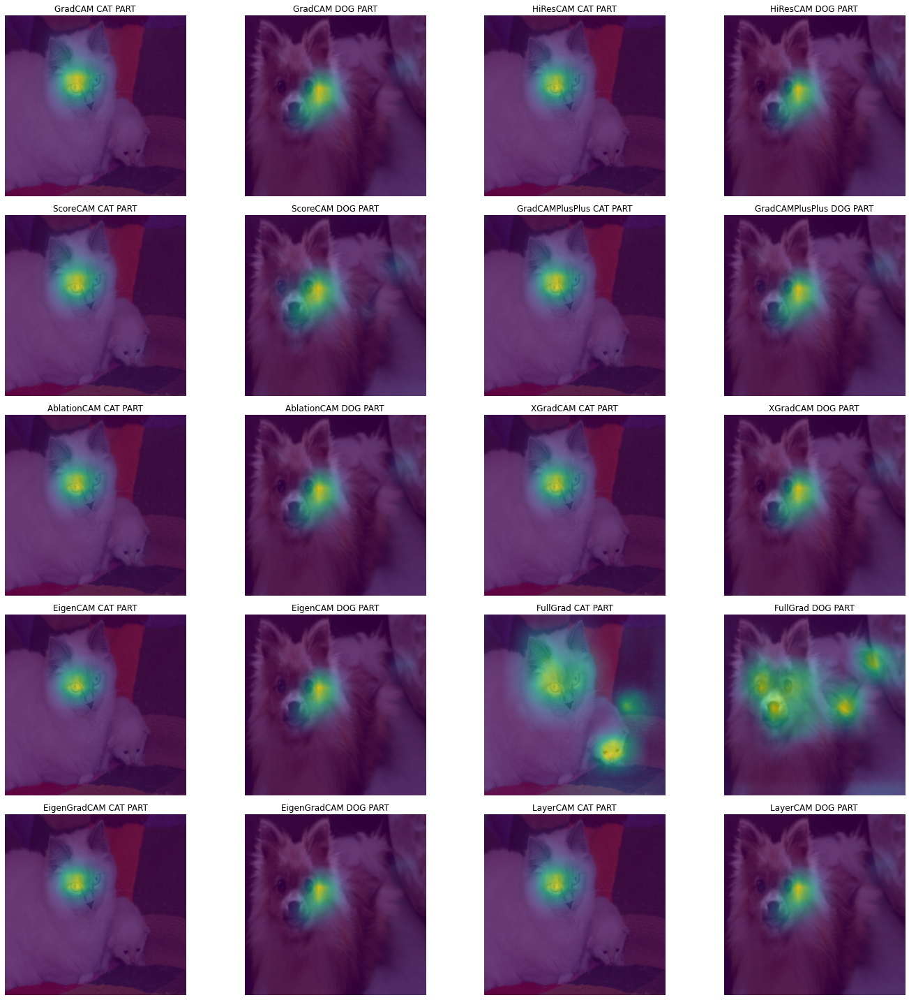

In [128]:
with open('fig_original_plt.pkl', 'rb') as file:
    fig_original_plt = pickle.load(file)
fig_original_plt.show()

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Matplotlib subplot을 Plotly로 변환
fig = make_subplots(rows=5, cols=4, subplot_titles=('GradCAM CAT PART', 'GradCAM DOG PART', 
                                                   'HiResCAM CAT PART', 'HiResCAM DOG PART',
                                                   'ScoreCAM CAT PART', 'ScoreCAM DOG PART',
                                                   'GradCAMPlusPlus CAT PART', 'GradCAMPlusPlus DOG PART',
                                                   'AblationCAM CAT PART', 'AblationCAM DOG PART',
                                                   'XGradCAM CAT PART', 'XGradCAM DOG PART',
                                                   'EigenCAM CAT PART', 'EigenCAM DOG PART',
                                                   'FullGrad CAT PART', 'FullGrad DOG PART',
                                                   'EigenGradCAM CAT PART', 'EigenGradCAM DOG PART',
                                                   'LayerCAM CAT PART', 'LayerCAM DOG PART'))

# 각 subplot에 이미지 및 heatmap 추가
for i, (image, heatmap, title) in enumerate([(cam_cat_gradcam_original.squeeze(), 'GradCAM CAT PART'),
                                              (cam_dog_gradcam_original.squeeze(), 'GradCAM DOG PART'),
                                              (cam_cat_hirescam_original.squeeze(), 'HiResCAM CAT PART'),
                                              (cam_dog_hirescam_original.squeeze(), 'HiResCAM DOG PART'),
                                              (cam_cat_scorecam_original.squeeze(), 'ScoreCAM CAT PART'),
                                              (cam_dog_scorecam_original.squeeze(), 'ScoreCAM DOG PART'),
                                              (cam_cat_gradcamplusplus_original.squeeze(), 'GradCAMPlusPlus CAT PART'),
                                              (cam_dog_gradcamplusplus_original.squeeze(), 'GradCAMPlusPlus DOG PART'),
                                              (cam_cat_ablationcam_original.squeeze(), 'AblationCAM CAT PART'),
                                              (cam_dog_ablationcam_original.squeeze(), 'AblationCAM DOG PART'),
                                              (cam_cat_xgradcam_original.squeeze(), 'XGradCAM CAT PART'),
                                              (cam_dog_xgradcam_original.squeeze(), 'XGradCAM DOG PART'),
                                              (cam_cat_eigencam_original.squeeze(), 'EigenCAM CAT PART'),
                                              (cam_dog_eigencam_original.squeeze(), 'EigenCAM DOG PART'),
                                              (cam_cat_fullgrad_original.squeeze(), 'FullGrad CAT PART'),
                                              (cam_dog_fullgrad_original.squeeze(), 'FullGrad DOG PART'),
                                              (cam_cat_eigengradcam_original.squeeze(), 'EigenGradCAM CAT PART'),
                                              (cam_dog_eigengradcam_original.squeeze(), 'EigenGradCAM DOG PART'),
                                              (cam_cat_layercam_original.squeeze(), 'LayerCAM CAT PART'),
                                              (cam_dog_layercam_original.squeeze(), 'LayerCAM DOG PART')]):
    row = i // 4 + 1
    col = i % 4 + 1

    fig.add_trace(go.Image(z=image, colorscale='Viridis'), row=row, col=col)
    fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True, row=row, col=col)
    fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True, row=row, col=col)
    fig.update_layout(title_text=title, title_font_size=16, showlegend=False)

# 그림 크기 조정 및 출력
fig.update_layout(width=1000, height=1200, title_text='Original', title_font_size=20)
fig.show()

with open('fig_original_plotly.pkl', 'wb') as file:
    pickle.dump(fig, file)

In [130]:
with open('fig_original_plotly.pkl', 'rb') as file:
    fig_original_plotly = pickle.load(file)
fig_original_plotly.show()

FileNotFoundError: [Errno 2] No such file or directory: 'fig_original_plotly.pkl'

## Figure_Randombox

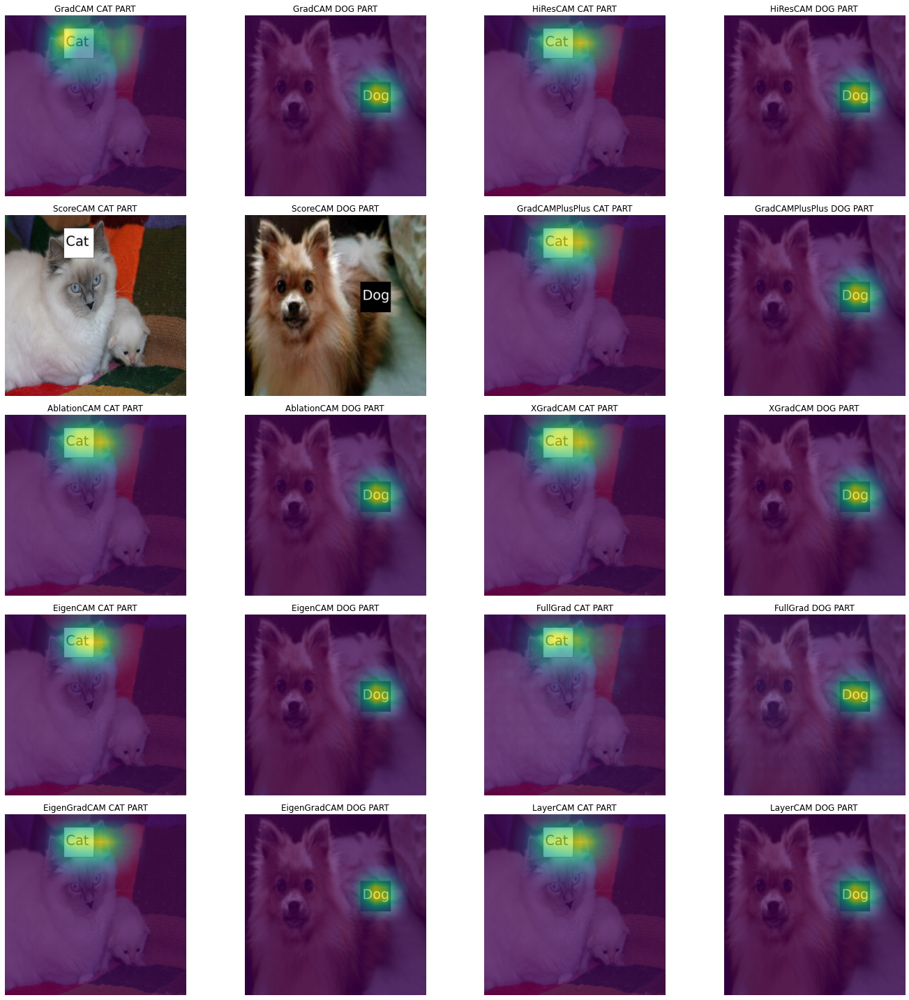

In [133]:
fig, ((ax1,ax2,ax3,ax4),
      (ax5,ax6,ax7,ax8),
      (ax9,ax10,ax11,ax12),
      (ax13,ax14,ax15,ax16),
     (ax17,ax18,ax19,ax20)) = plt.subplots(5,4) 
plt.title('Randombox')
#
dls.train.decode((x_cat_r,))[0].squeeze().show(ax=ax1)
ax1.imshow(cam_cat_gradcam_randombox.squeeze(), alpha=0.7)
ax1.set_title("GradCAM CAT PART")
#
dls.train.decode((x_dog_r,))[0].squeeze().show(ax=ax2)
ax2.imshow(cam_dog_gradcam_randombox.squeeze(), alpha=0.7)
ax2.set_title("GradCAM DOG PART")
#
dls.train.decode((x_cat_r,))[0].squeeze().show(ax=ax3)
ax3.imshow(cam_cat_hirescam_randombox.squeeze(), alpha=0.7)
ax3.set_title("HiResCAM CAT PART")
#
dls.train.decode((x_dog_r,))[0].squeeze().show(ax=ax4)
ax4.imshow(cam_dog_hirescam_randombox.squeeze(), alpha=0.7)
ax4.set_title("HiResCAM DOG PART")
#
dls.train.decode((x_cat_r,))[0].squeeze().show(ax=ax5)
ax5.imshow(cam_cat_scorecam_randombox.squeeze(), alpha=0.7)
ax5.set_title("ScoreCAM CAT PART")
#
dls.train.decode((x_dog_r,))[0].squeeze().show(ax=ax6)
ax6.imshow(cam_dog_scorecam_randombox.squeeze(), alpha=0.7)
ax6.set_title("ScoreCAM DOG PART")
#
dls.train.decode((x_cat_r,))[0].squeeze().show(ax=ax7)
ax7.imshow(cam_cat_gradcamplusplus_randombox.squeeze(), alpha=0.7)
ax7.set_title("GradCAMPlusPlus CAT PART")
#
dls.train.decode((x_dog_r,))[0].squeeze().show(ax=ax8)
ax8.imshow(cam_dog_gradcamplusplus_randombox.squeeze(), alpha=0.7)
ax8.set_title("GradCAMPlusPlus DOG PART")
#
dls.train.decode((x_cat_r,))[0].squeeze().show(ax=ax9)
ax9.imshow(cam_cat_ablationcam_randombox.squeeze(), alpha=0.7)
ax9.set_title("AblationCAM CAT PART")
#
dls.train.decode((x_dog_r,))[0].squeeze().show(ax=ax10)
ax10.imshow(cam_dog_ablationcam_randombox.squeeze(), alpha=0.7)
ax10.set_title("AblationCAM DOG PART")
#
dls.train.decode((x_cat_r,))[0].squeeze().show(ax=ax11)
ax11.imshow(cam_cat_xgradcam_randombox.squeeze(), alpha=0.7)
ax11.set_title("XGradCAM CAT PART")
#
dls.train.decode((x_dog_r,))[0].squeeze().show(ax=ax12)
ax12.imshow(cam_dog_xgradcam_randombox.squeeze(), alpha=0.7)
ax12.set_title("XGradCAM DOG PART")
#
dls.train.decode((x_cat_r,))[0].squeeze().show(ax=ax13)
ax13.imshow(cam_cat_eigencam_randombox.squeeze(), alpha=0.7)
ax13.set_title("EigenCAM CAT PART")
#
dls.train.decode((x_dog_r,))[0].squeeze().show(ax=ax14)
ax14.imshow(cam_dog_eigencam_randombox.squeeze(), alpha=0.7)
ax14.set_title("EigenCAM DOG PART")
#
dls.train.decode((x_cat_r,))[0].squeeze().show(ax=ax15)
ax15.imshow(cam_cat_fullgrad_randombox.squeeze(), alpha=0.7)
ax15.set_title("FullGrad CAT PART")
#
dls.train.decode((x_dog_r,))[0].squeeze().show(ax=ax16)
ax16.imshow(cam_dog_fullgrad_randombox.squeeze(), alpha=0.7)
ax16.set_title("FullGrad DOG PART")
#
dls.train.decode((x_cat_r,))[0].squeeze().show(ax=ax17)
ax17.imshow(cam_cat_eigengradcam_randombox.squeeze(), alpha=0.7)
ax17.set_title("EigenGradCAM CAT PART")
#
dls.train.decode((x_dog_r,))[0].squeeze().show(ax=ax18)
ax18.imshow(cam_dog_eigengradcam_randombox.squeeze(), alpha=0.7)
ax18.set_title("EigenGradCAM DOG PART")
#
dls.train.decode((x_cat_r,))[0].squeeze().show(ax=ax19)
ax19.imshow(cam_cat_layercam_randombox.squeeze(), alpha=0.7)
ax19.set_title("LayerCAM CAT PART")
#
dls.train.decode((x_dog_r,))[0].squeeze().show(ax=ax20)
ax20.imshow(cam_dog_layercam_randombox.squeeze(), alpha=0.7)
ax20.set_title("LayerCAM DOG PART")
#
fig.set_figwidth(20)            
fig.set_figheight(20)
fig.tight_layout()

# plt.savefig('randombox_other_plot.pdf', format='pdf')

with open('fig_randombox_plt.pkl', 'wb') as file:
    pickle.dump(fig, file)

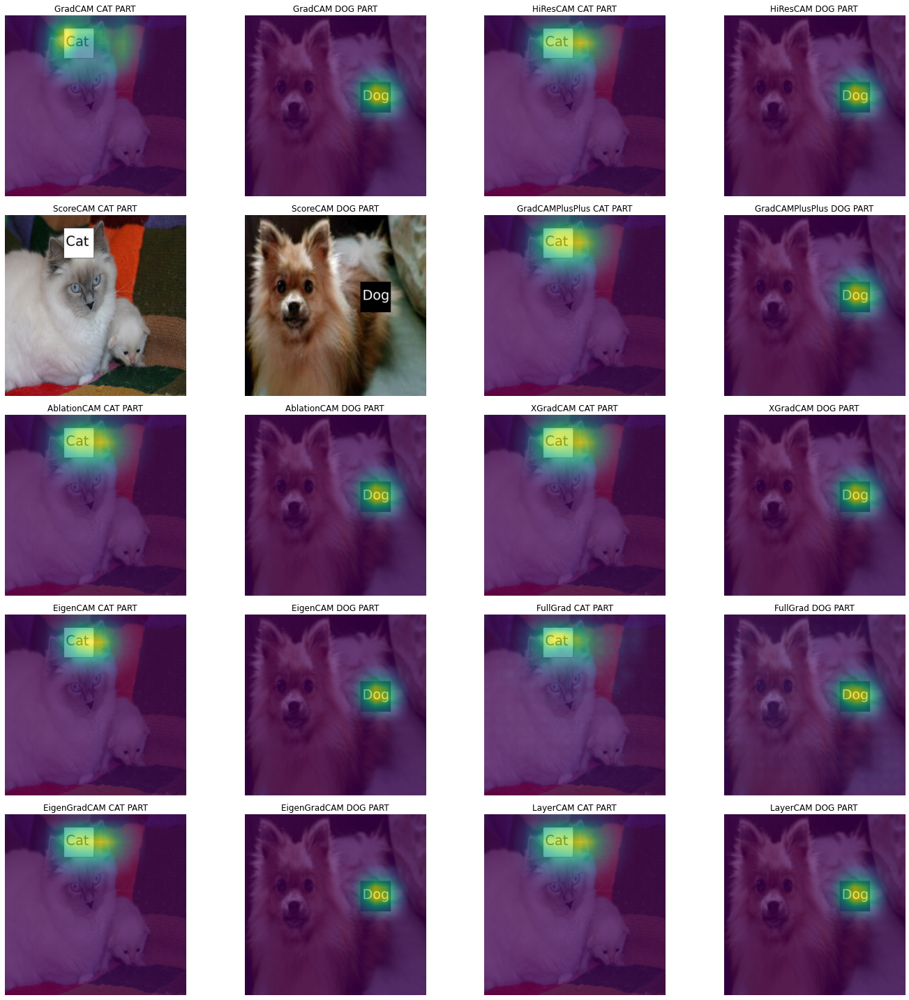

In [135]:
with open('fig_randombox_plt.pkl', 'rb') as file:
    fig_randombox_plt = pickle.load(file)
fig_randombox_plt.show()

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Matplotlib subplot을 Plotly로 변환
fig = make_subplots(rows=5, cols=4, subplot_titles=('GradCAM CAT PART', 'GradCAM DOG PART', 
                                                   'HiResCAM CAT PART', 'HiResCAM DOG PART',
                                                   'ScoreCAM CAT PART', 'ScoreCAM DOG PART',
                                                   'GradCAMPlusPlus CAT PART', 'GradCAMPlusPlus DOG PART',
                                                   'AblationCAM CAT PART', 'AblationCAM DOG PART',
                                                   'XGradCAM CAT PART', 'XGradCAM DOG PART',
                                                   'EigenCAM CAT PART', 'EigenCAM DOG PART',
                                                   'FullGrad CAT PART', 'FullGrad DOG PART',
                                                   'EigenGradCAM CAT PART', 'EigenGradCAM DOG PART',
                                                   'LayerCAM CAT PART', 'LayerCAM DOG PART'))

# 각 subplot에 이미지 및 heatmap 추가
for i, (image, heatmap, title) in enumerate([(cam_cat_gradcam_randombox.squeeze(), 'GradCAM CAT PART'),
                                              (cam_dog_gradcam_randombox.squeeze(), 'GradCAM DOG PART'),
                                              (cam_cat_hirescam_randombox.squeeze(), 'HiResCAM CAT PART'),
                                              (cam_dog_hirescam_randombox.squeeze(), 'HiResCAM DOG PART'),
                                              (cam_cat_scorecam_randombox.squeeze(), 'ScoreCAM CAT PART'),
                                              (cam_dog_scorecam_randombox.squeeze(), 'ScoreCAM DOG PART'),
                                              (cam_cat_gradcamplusplus_randombox.squeeze(), 'GradCAMPlusPlus CAT PART'),
                                              (cam_dog_gradcamplusplus_randombox.squeeze(), 'GradCAMPlusPlus DOG PART'),
                                              (cam_cat_ablationcam_randombox.squeeze(), 'AblationCAM CAT PART'),
                                              (cam_dog_ablationcam_randombox.squeeze(), 'AblationCAM DOG PART'),
                                              (cam_cat_xgradcam_randombox.squeeze(), 'XGradCAM CAT PART'),
                                              (cam_dog_xgradcam_randombox.squeeze(), 'XGradCAM DOG PART'),
                                              (cam_cat_eigencam_randombox.squeeze(), 'EigenCAM CAT PART'),
                                              (cam_dog_eigencam_randombox.squeeze(), 'EigenCAM DOG PART'),
                                              (cam_cat_fullgrad_randombox.squeeze(), 'FullGrad CAT PART'),
                                              (cam_dog_fullgrad_randombox.squeeze(), 'FullGrad DOG PART'),
                                              (cam_cat_eigengradcam_randombox.squeeze(), 'EigenGradCAM CAT PART'),
                                              (cam_dog_eigengradcam_randombox.squeeze(), 'EigenGradCAM DOG PART'),
                                              (cam_cat_layercam_randombox.squeeze(), 'LayerCAM CAT PART'),
                                              (cam_dog_layercam_randombox.squeeze(), 'LayerCAM DOG PART')]):
    row = i // 4 + 1
    col = i % 4 + 1

    # 이미지를 heatmap으로 표시하는 trace 추가
    trace_heatmap = go.Heatmap(z=heatmap, colorscale='Viridis', showscale=False)
    fig.add_trace(trace_heatmap, row=row, col=col)

    # 이미지를 추가
    trace_image = go.Image(z=image, colorscale='Viridis')
    fig.add_trace(trace_image, row=row, col=col)

    # subplot 스타일 조정
    fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True, row=row, col=col)
    fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True, row=row, col=col)
    fig.update_layout(title_text=title, title_font_size=16, showlegend=False)

# 그림 크기 조정 및 출력
fig.update_layout(width=1000, height=1200, title_text='Randombox', title_font_size=20)
fig.show()
with open('fig_randombox_plotly.pkl', 'wb') as file:
    pickle.dump(fig, file)

In [ ]:
with open('fig_randombox_plotly.pkl', 'rb') as file:
    fig_original_plt = pickle.load(file)
fig_original_plt.show()